Hello there!

Welcome to our Jupyter Notebook, where we dive into the basics of quantum computing and explore a fascinating algorithm along the way.



 This notebook was crafted with the curiosity (and confusion) we felt as beginners—when *quantum computing* was just an intimidating yet intriguing word. We hope it captures that spirit and helps fellow explorers who are just starting out.

First thing first, We need to weaponize ourselves to fight the battle!
This includes installing few softwares and importing them before we write our code.

Qiskit (Quantum Information Science Kit) is an open-source quantum computing framework developed by IBM. It allows users to create, simulate, and run quantum circuits on real quantum hardware or simulators.
More specifically, it's an open-source Python SDK (software development kit) for quantum computing. It integrates easily with other Python tools like NumPy, Matplotlib, and Jupyter Notebooks (Which you will see in the near future)

And just like any other python library, few installation steps are necessary.



In [1]:
#!pip uninstall qiskit[all] qiskit-aer qiskit-ibm-runtime qiskit-terra -y 

In [2]:
#!pip install qiskit[all] qiskit-aer qiskit-ibm-runtime

In [3]:
from qiskit import *
from qiskit.quantum_info import Statevector
from qiskit_aer import Aer
from qiskit.visualization import plot_histogram, visualize_transition
from qiskit_ibm_runtime import QiskitRuntimeService
from qiskit_ibm_runtime import Sampler
from datetime import datetime
import numpy as np
import math #for pi, sin and cos function 
import random

This includes all the libraries and their sub-parts which we will be using in this tutorial (Damn, that's a lot indeed)


<div style="background-color:#fff9c4; color:#000000; padding:15px; border-left: 6px solid #fbc02d; border-radius: 4px;">

<b> QUBIT </b>
---------

But, before we get started, let's discuss one fundamental thing:  
_**What IS a Qubit?**_

* Quantum bits, also called Qubits, are the fundamental unit of quantum information. They are represented mathematically as vectors in a two-dimensional complex vector space, typically using the Dirac "bra-ket" notation.  
* The standard basis states for a single qubit are denoted as ∣0⟩ and ∣1⟩, which correspond to the column vectors:  
∣0⟩ = [1 0], ∣1⟩ = [0 1]

* A general qubit state is a superposition of these basis states and can be written as:  
∣ψ⟩ = α∣0⟩ + β∣1⟩  
where α and β are complex numbers called probability amplitudes, and they satisfy the normalization condition:  
**∣α∣² + ∣β∣² = 1** 
This ensures that the total probability of measuring the qubit in either state is **1**.

* For multiple qubits (like 3 qubit systems which we will be using here), the system is described by a vector in a higher-dimensional space. For example, a two-qubit system has four basis states: ∣00⟩, ∣01⟩, ∣10⟩, ∣11⟩, each represented by a four-dimensional vector.

* They can also be visualized on the Bloch sphere, where any pure qubit state corresponds to a point on the sphere's surface, parameterized by two angles
* 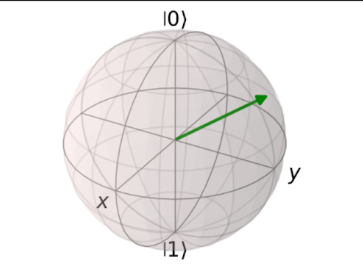
</div>



Phew, too much thoery ? Don't worry, each and every statement in the above paragraph will be revisited in our notebook.

Now, The first step towards quantum computing :-

_*How to initialise qubits*_
---------

* A quantum register is a group of qubits that work together. You can think of this as setting up three “quantum wires” that you can use in your quantum circuit to perform quantum operations
* A classical register is a group of classical bits used to store the results of measurements from qubits
* The number mentioned in brackets specify the number of qubits and bits are to be initialised in the respective registers.

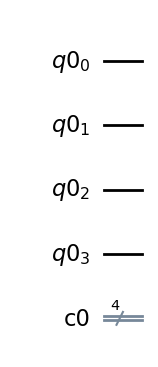

In [4]:
q_reg = QuantumRegister(4)
c_reg = ClassicalRegister(4)
circ = QuantumCircuit(q_reg, c_reg) #This establishes the base elements of the quantum circuit
circ.draw('mpl') #mpl refers to MatPlotlib which will give us the circuit diagram here!

<div style="background-color:#fff9c4; color:#000000; padding:15px; border-left: 6px solid #fbc02d; border-radius: 4px;">

<b> QUANTUM GATES </b>
---------

Quantum gates are the basic building blocks of quantum circuits — they are operations that change the state of the qubits. You can think of them like classical logic gates (AND, OR, NOT) and how they change bits, except they work on qubits.
The following are commonly used gates :
*  Hadamard Gate
*  Ry Gate
*  CNOT Operator
*  CZ Gate


</div>

<div style="background-color:#fde2e4; color:#000000; padding:15px; border-left: 6px solid #f8a5b4; border-radius: 4px;">
  <b>Hadamard Gate</b>  
  <hr>
  <p>
    The Hadamard gate (often written as <code>H</code>) transforms a qubit from a definite state (<code>|0⟩</code> or <code>|1⟩</code>) into a <em>superposition</em> of both states. It is crucial for enabling quantum parallelism, which is the ability of quantum computers to explore multiple computational paths <strong>simultaneously</strong>.
  </p>
  <p>
    <strong>Matrix representation</strong><br><br>
    \( H = \frac{1}{\sqrt{2}} \begin{bmatrix} 1 & 1 \\ 1 & -1 \end{bmatrix} \)
  </p>
  <p>
    Applying this gate to a qubit is like flipping a fair coin — it puts the qubit into a state where it has an equal probability of being measured as 0 or 1, but unlike a coin, the qubit is in both states at once until measured.
  </p>
</div>





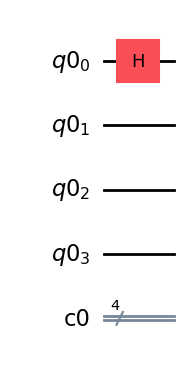

In [5]:
#Hadamard Gate - Basic Example
#Remember, the numbering in quantum circuits begin from 0 - so by this example the number of qbits are 0,1,2,3,4
#Implement:- your_circuit.h(qubit_register_name [qubit_number]) applies Hadamard Gate in a circuit
circ.h(q_reg[0])
circ.draw('mpl')

<div style="background-color:#fde2e4; color:#000000; padding:15px; border-left: 6px solid #f8a5b4; border-radius: 4px;">
  <b>RY Gate</b>  
  <hr>
  <p>
    The RY gate performs a rotation of a qubit's state around the Y-axis of the Bloch sphere by a specified angle θ (in radians). It is a parameterized gate, meaning the amount of rotation is determined by the value of θ.
  </p>

  <p><strong>Matrix representation:</strong></p>
  <p>
    \[
    R_Y(\theta) = 
    \begin{bmatrix}
      \cos(\theta/2) & -\sin(\theta/2) \\
      \sin(\theta/2) & \cos(\theta/2)
    \end{bmatrix}
    \]
  </p>

  <p>
    This matrix represents a counter-clockwise rotation of the qubit around the Y-axis on the Bloch sphere. It is a rotation operator for a real-valued qubit in two-dimensional space.
  </p>
  
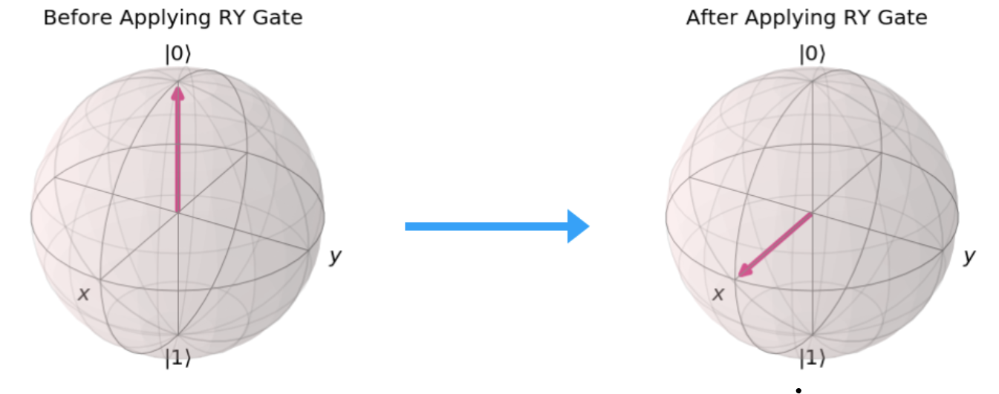 


  <p>
    
  </p>
</div>



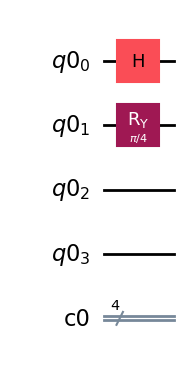

In [6]:
#Ry Gate -- Basic Example

#Implement:- your_circuit.ry(2*angle_of_rotation, qubit_register_name[qubit_number])
theta = math.pi/8
circ.ry(2*theta, q_reg[1])

#Remark that we pass the twice of the rotation angle for the rotations on the unit circle.

circ.draw("mpl")

In [7]:
# For visualization
q_visual = QuantumCircuit(1)
q_visual.ry(2*theta,0)
visualize_transition(q_visual)

C:\Users\manthramohana\AppData\Local\Temp\ipykernel_8884\572301146.py:4: DeprecationWarning: The function ``qiskit.visualization.transition_visualization.visualize_transition()`` is deprecated as of Qiskit 1.2.0. It will be removed in the 2.0 release.
  visualize_transition(q_visual)



<div class="alert alert-block alert-info"> 
  <b>Exercise 1</b><br><br>

  <strong>Question:</strong>  
  Why do we input an angle of <code>2*θ</code> in the RY(θ) gate to rotate the qubit by, though the angle given is theta?
  <br><br>
  <em>Hint:</em> Consider how qubit rotations are visualized on the Bloch sphere.

  <details>
    <summary><strong>Answer:</strong></summary>
    <br>
    The RY gate is defined by the following unitary matrix:
    <br><br>
    \[
    R_Y(\theta) = \begin{bmatrix}
      \cos(\theta/2) & -\sin(\theta/2) \\
      \sin(\theta/2) & \cos(\theta/2)
    \end{bmatrix}
    \]
    <br>
    The <code>θ/2</code> appears in the matrix, but when this matrix acts on a qubit, the **actual rotation** of the qubit’s state vector on the Bloch sphere is by an angle of <code>θ</code> about the Y-axis. Hence to apply an angle of <code>θ</code>, we need to hardcode <code>2θ</code>



  </details>
</div>



<div style="background-color:#fde2e4; color:#000000; padding:15px; border-left: 6px solid #f8a5b4; border-radius: 4px;">
  <b>CNOT Gate</b>  
  <hr>
  <p>
    The CNOT gate is a two-qubit quantum gate that flips (applies a NOT or Pauli-X operation to) the target qubit <strong>only if</strong> the control qubit is in the state ∣1⟩.
    It’s the quantum analogue of the classical controlled-NOT logic gate.
  </p>

  <p>
    The CNOT gate is essential for creating entangled states (e.g., Bell states).
  </p>

  <p><strong>Matrix representation:</strong></p>

  <p>
    \[
    \text{CNOT} =
    \begin{bmatrix}
      1 & 0 & 0 & 0 \\
      0 & 1 & 0 & 0 \\
      0 & 0 & 0 & 1 \\
      0 & 0 & 1 & 0
    \end{bmatrix}
    \]
  </p>

  <p>
    This matrix maps the input state ∣a, b⟩ to ∣a, a⊕b⟩,
    where ⊕ denotes the XOR (exclusive OR) operation.
  </p>
</div>







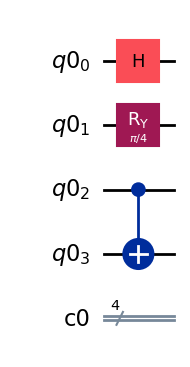

In [8]:
#CNOT Gate -- Basic Example
# Implement :- your_circuit.cx(control_qubit,target_qubit)

circ.cx(q_reg[2], q_reg[3])
circ.draw("mpl")


<div style="background-color:#fde2e4; color:#000000; padding:15px; border-left: 6px solid #f8a5b4; border-radius: 4px;">
  <b>CZ Gate</b>  
  <hr>
  <p>
    The Controlled-Z (CZ) gate is a two-qubit quantum gate that applies a phase flip (i.e., multiplies by −1) to the target qubit <strong>if the control qubit is in the state</strong> ∣1⟩.
  </p>

  <p>
    When combined with Hadamard gates, the CZ gate can generate entangled states such as the Bell states. For example:
  </p>

  <p><strong>Matrix representation:</strong></p>

  <p>
    \[
    \text{CZ} =
    \begin{bmatrix}
      1 & 0 & 0 & 0 \\
      0 & 1 & 0 & 0 \\
      0 & 0 & 1 & 0 \\
      0 & 0 & 0 & -1
    \end{bmatrix}
    \]
  </p>

</div>








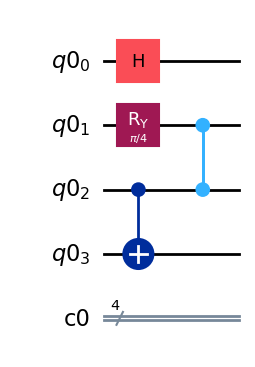

In [9]:
#CZ gate -- Basic Example
# Implement :- your_circuit.cz(control_qubit,target_qubit)

circ.cz(q_reg[1], q_reg[2])
circ.draw("mpl")

We just completed the major quantum gates which we are going to be using in this tutorial!
Taking a little diversion from the usual track, let's discuss another important concept which we going to be using the future cell blocks.

The picked angle is 295.2 degrees and 5.1522 radians
a = 0.426 , b = -0.905
a² = 0.181 , b² = 0.819


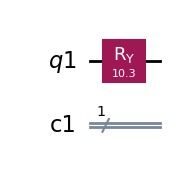

In [10]:
#How to apply random theta in ry gate


# Create quantum and classical registers
q1 = QuantumRegister(1)
c1 = ClassicalRegister(1)
qc1 = QuantumCircuit(q1, c1)

# Generate a random angle in radians
r = random.randrange(100)
omega = 2 * math.pi * (r / 100)  # radians

# Print the chosen angle
print("The picked angle is", round(r * 3.6, 2), "degrees and", round(omega, 4), "radians")

# Compute amplitude components
a = math.cos(omega)
b = math.sin(omega)

print("a =", round(a, 3), ", b =", round(b, 3))
print("a² =", round(a ** 2, 3), ", b² =", round(b ** 2, 3))

# Apply RY rotation to generate (a|0⟩ + b|1⟩)
qc1.ry(2 * omega, q1[0])  # RY(2*omega) gives final state: cos(omega)|0> + sin(omega)|1>

# Optional: Draw circuit
qc1.draw("mpl")

This allows us to apply a random angle to the RY gate , a crucial step, as you’ll soon see, for testing the robustness and accuracy of our implementation. After all, hardcoding angles every time would feel a bit like cheating, wouldn’t it? To truly demonstrate the power of this famous algorithm, we’re going to do it right ,no shortcuts!

<div class="alert alert-block alert-info"> <b>Exercise.2 </b>

Verify the Normalization Rule in the above code. What does it tell us about the probability of getting ∣0⟩ and ∣1⟩?

<details>

<summary>Solution:</summary>

In the results above, you'll notice that \( a^2 + b^2 = 1 \). This is the **normalization condition** of quantum states, and it's essential in quantum mechanics. 

It reflects the fact that ∣0⟩ and ∣1⟩ are **mutually exclusive** outcomes when a qubit is measured — you will get exactly one of them. Since these are the only two possibilities, their probabilities must add up to 1.

The probability of measuring the qubit in each state is:

- \( P(∣0⟩) = |a|^2 \)
- \( P(∣1⟩) = |b|^2 \)

So, the normalization rule ensures that:

\[
|a|^2 + |b|^2 = 1
\]

This guarantees that the total probability of all possible outcomes is 100%.

</details>

</div>


<div class="alert alert-block alert-info"> <b>Exercise.3 </b>

<b> Coding Exercise: Initializing Qubits and Applying Quantum Gates</b><br><br>

Haha, you thought we’d just let you off the hook? We've covered all the techniques — now it's time to put them to the test in a mini quantum coding battle! Let's see how well you've understood the fundamentals.

<br>
<b>Instructions:</b>
<ol>
  <li><b>STEP 1:</b> Create a quantum circuit with 3 qubits. Use the notation: <code>qc</code> = quantum circuit, <code>q_reg1</code> for the quantum register, and <code>c_reg1</code> for the classical register.</li>
  <li><b>STEP 2:</b> Apply an <code>RY</code> gate with angle <code>θ = π/6</code> on the first qubit (<code>q_reg1[0]</code>).</li>
  <li><b>STEP 3:</b> Apply a Hadamard gate to the second qubit (<code>q_reg1[1]</code>).</li>
  <li><b>STEP 4:</b> Apply a <code>CNOT</code> gate where the control qubit is the second qubit (<code>q_reg1[1]</code>) and the target is the third qubit (<code>q_reg1[2]</code>).</li>
</ol>

Don’t worry if you don’t get it right on the first try — go back, review the theory, revisit the example code blocks, and try again. You've got this!





In [11]:
#Exercise.1 -- Intialising qubits and applying the gates
def exercise():

#write your code here

  #STEP.1 :-
           q_reg1 = QuantumRegister(3)
           c_reg1 = ClassicalRegister(3)
           qc = QuantumCircuit(q_reg1, c_reg1)

  #STEP.2 :-
           qc.ry(2*math.pi/6, q_reg1[0])
  #STEP.3 :-
           qc.h(q_reg1[1])
  #STEP.4 :-
           qc.cx(q_reg1[1],q_reg1[2])



 #your code ends here
           qc.measure(q_reg1, c_reg1)
           qc.draw("mpl")
           return qc


 A Moment of Honesty... We may have just made you (very casually) pull off the **first three steps** of the 
 **Quantum Teleportation Algorithm**.

Sounds fancy, doesn’t it?  
But honestly — it’s not as intimidating as it sounds.

<div style="background-color:#fff9c4; color:#000000; padding:15px; border-left: 6px solid #fbc02d; border-radius: 4px;">

<b> QUANTUM TELEPORTATION</b>
---------



Anya has a qubit of unknown state with her:

$$
|\psi\rangle = \alpha|0\rangle + \beta|1\rangle
$$

She needs to send this qubit to Bond. To do so, they must first share an entangled pair (EPR pair). A common choice is the Bell state:

$$
|\Phi^+\rangle = \frac{1}{\sqrt{2}}(|00\rangle + |11\rangle)
$$

The first qubit of the Bell pair belongs to Anya, and the second belongs to Bond. Now the system becomes a 3-qubit system. The joint state of the entire system is:

$$
|\Psi\rangle = |\psi\rangle \otimes |\Phi^+\rangle = (\alpha|0\rangle + \beta|1\rangle) \otimes \frac{1}{\sqrt{2}}(|00\rangle + |11\rangle)
$$

Expanding this:

$$
|\Psi\rangle = \frac{1}{\sqrt{2}}[\alpha|000\rangle + \alpha|011\rangle + \beta|100\rangle + \beta|111\rangle]
$$

Next, a CNOT gate is applied to Anya’s two qubits (the unknown qubit and her part of the entangled pair), followed by a Hadamard gate on the first qubit. After these operations, the 3-qubit state becomes:

$$
|\Psi\rangle = \frac{1}{2} \left[ 
|00\rangle(\alpha|0\rangle + \beta|1\rangle) + 
|01\rangle(\alpha|1\rangle + \beta|0\rangle) + 
|10\rangle(\alpha|0\rangle - \beta|1\rangle) + 
|11\rangle(\alpha|1\rangle - \beta|0\rangle) 
\right]
$$

Here, the **first two qubits** are with Anya, and the **third qubit** is with Bond.

Anya now measures her two qubits, which collapses the system into one of the four possible outcomes. Based on the outcome, Bond applies the appropriate correction to retrieve the original state \( |\psi\rangle \).

#### Correction Table

| Measurement Outcome | Bond's Qubit State                        | Correction Required   |
|---------------------|-------------------------------------------|------------------------|
| \( |00\rangle \)     | \( \alpha|0\rangle + \beta|1\rangle \)     | No correction          |
| \( |01\rangle \)     | \( \alpha|1\rangle + \beta|0\rangle \)     | Apply **X** gate       |
| \( |10\rangle \)     | \( \alpha|0\rangle - \beta|1\rangle \)     | Apply **Z** gate       |
| \( |11\rangle \)     | \( \alpha|1\rangle - \beta|0\rangle \)     | Apply **X** and **Z** gates |

Bond uses the two classical bits (from Anya’s measurement) to determine the required correction and recover the original quantum state \( |\psi\rangle \).


</div>



<div class="alert alert-block alert-info">
  <h4><b> Exercise 4: THE LAST WAR</b></h4>
  
  It's time for the final showdown.

  You've studied the theory, explored the steps, and now the moment has come to wield your quantum powers for real — 
  it’s time to **implement Quantum Teleportation**.

  In the next code cell, you’ll find a **skeleton** of the teleportation algorithm waiting for you.  
  Your mission? Fill in the blanks. Apply the right quantum gates. Follow the logic you've learned. 

  Bring the qubits to life. Complete the protocol.  
  And claim victory in the ultimate quantum battle.

  <br>
  <b>Challenge:</b> Use your understanding of entanglement, measurement, and classical communication to complete the teleportation sequence from start to finish.


</div>


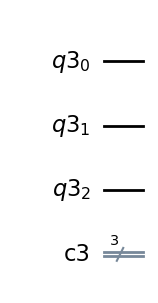

In [33]:
# Exercise.4 -- Skeleton Code

#LEVEL.1

q = QuantumRegister(3)
c = ClassicalRegister(3)
ckt = QuantumCircuit(q, c)
ckt.draw('mpl')



In [34]:
#LEVEL.2

r = random.randrange(100)
theta = 2*math.pi*(r/100) # radians
print("the picked angle is",r*3.6,"degrees and",theta,"radians")

a = math.cos(theta)
b = math.sin(theta)

print("|0> amplitude(a) =",round(a,3),"|1> amplitude(b) =",round(b,3))
print("a*a=",round(a**2,3),"b*b=",round(b**2,3))

#START HERE

# apply the necessary gate here! 


#END HERE

the picked angle is 68.4 degrees and 1.1938052083641213 radians
|0> amplitude(a) = 0.368 |1> amplitude(b) = 0.93
a*a= 0.136 b*b= 0.864


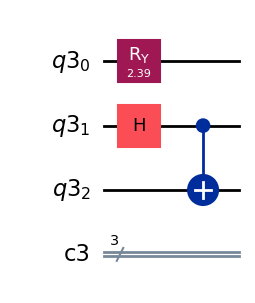

In [35]:
#LEVEL.3

#START HERE

#apply the necessary gate here!


#END HERE

ckt.cx(q[1], q[2]) #This leads to the entanglement
ckt.draw('mpl')

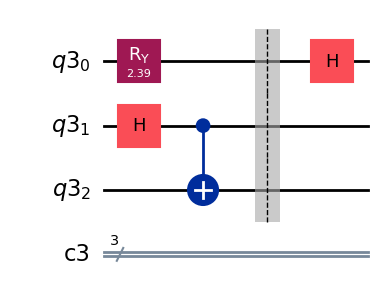

In [36]:


#LEVEL.4


ckt.barrier() 

#START HERE

# apply the necessary gate here

#END HERE

ckt.h(q[0])
ckt.draw('mpl')

In [37]:
statevector = Statevector.from_instruction(ckt)
statevector.draw('latex')

<IPython.core.display.Latex object>

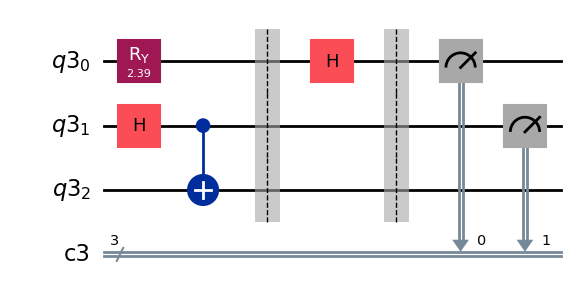

In [38]:
ckt.barrier() 
ckt.measure([q[0], q[1]], [c[0], c[1]])
ckt.draw('mpl')

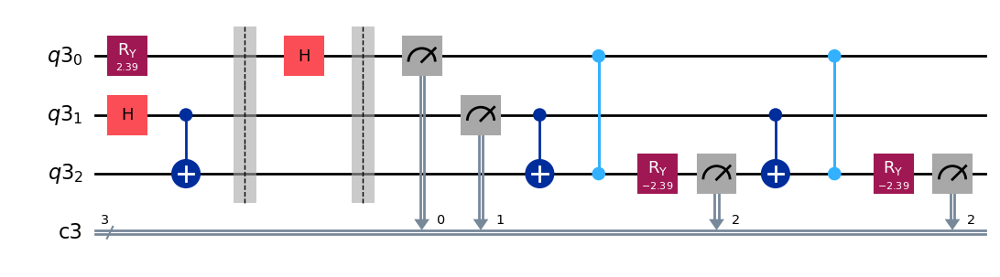

In [47]:

# Here, after Anya measures the qubits, she send to Bond. After which he needs to perform certain operations. 
ckt.cx(1,2)
ckt.cz(0,2)
# Logic :- If first qubit has a 1 then z operator is applied on Bond's Qubit. and if second qubit is a 1 then NOT operator is used on Bond's Qubit.

ckt.ry(2*theta, q[2]).inverse()

ckt.measure([q[2]], [c[2]])
ckt.draw('mpl')

<div class="alert alert-block alert-info"> <b>Exercise.5 </b>

Why do you think we are using the inverse of the `RY` gate here? What purpose does it serve?

<details>

<summary>Solution:</summary>
 * Initially, we prepared the qubit (Anya's qubit) in a specific quantum state using an `RY(θ)` rotation.
 
* If teleportation works correctly, **Bob's qubit** (the last qubit) should now hold **the same quantum state**.
  
* By applying the **inverse rotation `RY(-θ)`** on Bob's qubit, we are effectively reversing the state preparation.
  
* If the teleportation was successful, this inverse operation should return Bob's qubit to the `|0⟩` state.

  
* Measuring `|0⟩` confirms that the quantum state was **faithfully transferred** from Anya to Bob.



In [40]:
%run -i Local_Testing_Script.py

False
Your circuit is wrong, make sure you are using the correct gates.


C:\Users\manthramohana\1.0) Quantum Teleportation_PS_QMinha\Local_Testing_Script.py:19: DeprecationWarning: Treating CircuitInstruction as an iterable is deprecated legacy behavior since Qiskit 1.2, and will be removed in Qiskit 3.0. Instead, use the `operation`, `qubits` and `clbits` named attributes.
  for instr, qargs, cargs in circuit.data:


<div style="background-color:#fff9c4; color:#000000; padding:20px; border-left: 6px solid #fbc02d; border-radius: 6px; font-family: Arial, sans-serif; line-height:1.5;">

<b style="font-size:1.3em;">QUANTUM SIMULATORS</b>
<hr style="border:1px solid #fbc02d; margin:10px 0;">

Quantum simulators are classical computing systems specially designed to <b>mimic the behavior of quantum systems</b> that are too complex to study directly.

In simpler terms, they help scientists simulate how quantum particles interact and evolve — enabling experimentation and testing without needing real quantum hardware.

---

<b>The QASM Simulator</b> is a classical quantum circuit simulator provided by IBM’s Qiskit framework. It executes quantum circuits by simulating measurements and returning output counts, closely emulating real quantum devices.

---

<b>Key Concepts in Simulation:</b>

<ul>
  <li><b>Shots:</b> This sets the number of times the quantum circuit is executed (or "sampled"). In the example below, <code>shots = 3000</code>. Try changing this number to see how it affects the measurement statistics and final results.</li>
  
  <li><b>Transpiler:</b> A tool in Qiskit (and other quantum SDKs) that rewrites or transforms your quantum circuit to ensure it is compatible with the target backend by:
    <ol>
      <li>Matching the hardware’s <b>supported gate set</b> (basis gates)</li>
      <li>Respecting the hardware’s <b>qubit connectivity</b> (topology)</li>
      <li>Optimizing according to goals like <b>reducing circuit depth</b> or minimizing gate count</li>
    </ol>
  </li>
</ul>

</div>



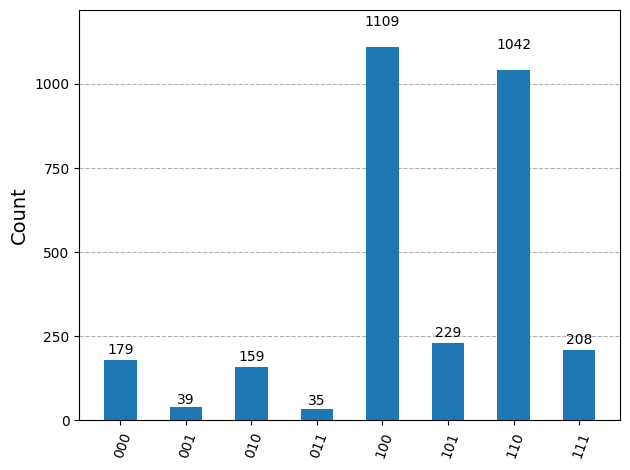

In [41]:
#SIMULATOR CODE
shots = 3000 #Try experimenting with different values of shots!
backend = Aer.get_backend("qasm_simulator")
transpiled_circuit = transpile(ckt, backend)
job = backend.run(transpiled_circuit, shots = shots)
results = job.result()
plot_histogram(results.get_counts())

Quantum measurements are probabilistic so the more shots(times you run a code) you run ,the better estimate you get.

Here , using Qiskit Aer's classical simulator called qasm_simulator, we simulate the classical outcomes of a quantum circuit (after measurement).

The transpiled circuit is run 3000 times and the results are displayed in a histogram.

<div style="background-color:#fff9c4; color:#000000; padding:15px; border-left: 6px solid #fbc02d; border-radius: 6px; font-family: Arial, sans-serif;">

<b style="font-size:1.2em;"> Example Running on Real Quantum Hardware</b>
<hr style="border:1px solid #fbc02d; margin:8px 0;">

<ol style="margin-left: 20px;">
  <li>
    <b>Which backend did you choose?</b><br>
    <i>Answer:</i>  
    Using the line <code>backend = service.least_busy(simulator=False, min_num_qubits=3)</code>,  
    we automatically select the <b>least busy available real quantum device</b> that meets our requirements.
  </li>
  
  <li style="margin-top: 10px;">
    <b>Why is this backend appropriate (number of qubits, connectivity, etc.)?</b><br>
    <i>Answer:</i>  
    Setting <code>min_num_qubits=3</code> ensures the chosen device has at least 3 qubits —  
    essential because our circuit requires 3 (or more) qubits.  
    Selecting the “least busy” backend minimizes waiting time by picking a device with a short job queue.  
    Additionally, the transpiler customizes your circuit to fit the backend’s qubit connectivity and gate set, ensuring compatibility and efficient execution.
  </li>
</ol>

</div>


In [42]:
#3) Code for selecting the backend
QiskitRuntimeService.save_account(channel="ibm_quantum", token= "1d33c48c70bad9809b8ef3e65d4a2aba3223f3f2bab19d80d0b7658bee149e3455a3618e738e8f35ce84308d33e2b631c92efddcb0a4a02d05108d149784855a" #your APT Key under quotes ""
                                  , overwrite=True)
service = QiskitRuntimeService()
backend = service.least_busy(simulator=False, min_num_qubits=3)
transpiled_circuit = transpile(ckt, backend)
job = Sampler(backend).run([transpiled_circuit], shots = shots) #4) Job Submission 
result = job.result()

print(f"Backend name: {backend.name}, Job ID: {job.job_id()}") #5) This prints the backend used name and the Job ID

C:\Users\manthramohana\AppData\Local\Temp\ipykernel_8884\275050543.py:4: DeprecationWarning: The "ibm_quantum" channel option is deprecated and will be sunset on 1 July. After this date, "ibm_cloud" and "local" will be the only valid channels. For information on migrating to the new IBM Quantum Platform on the "ibm_cloud" channel, review the migration guide https://quantum.cloud.ibm.com/docs/migration-guides/classic-iqp-to-cloud-iqp .
  service = QiskitRuntimeService()


Backend name: ibm_sherbrooke, Job ID: d0mr6gab5pe0008c6ds0


{'110': 1043, '101': 190, '100': 1012, '011': 31, '000': 241, '010': 223, '111': 218, '001': 42}


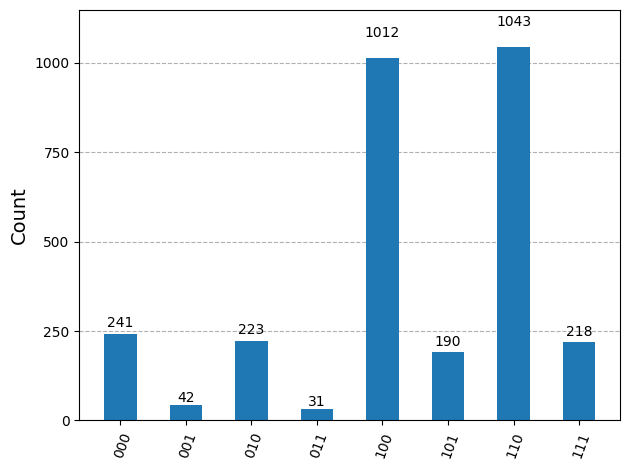

In [46]:
bit_array = list(result[0].data.values())[0]
counts = bit_array.get_counts()
print(counts)
plot_histogram(counts)

In [44]:
def time_diff(start, end):
  fmt = "%Y-%m-%dT%H:%M:%S.%fZ"
  start_time = datetime.strptime(start, fmt)
  end_time = datetime.strptime(end, fmt)
  diff = end_time - start_time
  return diff.seconds

<div style="background-color:#fff9c4; color:#000000; padding:15px; border-left: 6px solid #fbc02d; border-radius: 6px; font-family: Arial, sans-serif;">

<b style="font-size:1.2em;"> </b> Estimate of Hardware Runtime

<hr style="border:1px solid #fbc02d; margin:8px 0;">

<ol style="margin-left: 20px;">
  <li>
    <b>Number of Qubits</b><br>
    <i>Answer:</i>  
 3
  </li>
  
  <li style="margin-top: 10px;">
    <b>Circuit Depth</b><br>
    <i>Answer:</i>  
9

    
    
  </li>

  <li>
    <b>Number of Shots</b><br>
    <i>Answer:</i>  
 3000 , but can be experimented by the user! 
  </li>
   <li>
    <b>Estimated Device Runtime</b><br>
    <i>Answer:</i>  
 Printed in the following code block below.
  </li>
<li>
    <b>What If the Estimated Runtime Is Long?</b><br>
    <i>Answer:</i>  

If the **estimated hardware runtime** is **close to or exceeds 5 minutes**,  the following optimizations can be made to reduce queue and execution time:

  1. Reduce the Number of Shots
- Fewer shots (e.g., reducing from 3000 to 1024 or 512) decreasing how long the quantum processor spends executing the circuit.

 2. A shallower circuit reduces the risk of decoherence and requires less hardware time to execute.
- Simplify the Problem

  </li>
  
</ol>

</div>

In [45]:
metrics = job.metrics()
start_time = metrics['timestamps']['created']
end_time = metrics['timestamps']['running']
estimated_start = metrics['estimated_start_time']
estimated_end = metrics['estimated_completion_time']

print(f"Estimated runtime: {time_diff(estimated_start, estimated_end)}s")
print(f"Actual runtime: {time_diff(start_time, end_time)}s")

Estimated runtime: 2s
Actual runtime: 3s


<div style="background-color:#fff9c4; color:#000000; padding:15px; border-left: 6px solid #fbc02d; border-radius: 6px; font-family: Arial, sans-serif;">

<b style="font-size:1.2em;"> </b>Result Analysis 

<hr style="border:1px solid #fbc02d; margin:8px 0;">

<ol style="margin-left: 20px;">
  <li>
    <b> Comparison between the Simulator results and the Hardware results</b><br>
    <i>Answer:</i>  
      In simulation, (kindly see the graphs plotted above for both) the last qubit (Bob's qubit) typically collapses to the expected state |0⟩ due to the application of the correct inverse operations in an ideal, noise-free environment.
However, when running on actual quantum hardware, there's a small probability of observing the last qubit in the |1⟩ state.
This deviation is due to noise and imperfections in real quantum devices ,such as decoherence, and readout noise ,which can affect the final quantum state.
 
  </li>

  </ol>